In [1]:
#importiamo le librerie di base
import numpy as np 
import pandas as pd 
import librosa.display  
import matplotlib.pyplot as plt  
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer  # Importa PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score, hinge_loss
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.pipeline import make_pipeline
from sklearn.inspection import permutation_importance


In [2]:

pd.set_option('display.max_columns', None)  #per stampare tutte le colonne
music_data_original = pd.read_csv('Data/features_30_sec.csv') 


colonne=music_data_original.columns.size
print(f'IL DATASET PRESO UN CONSIDERAZIONE HA {colonne} PER OGNI CAMPIONE')
music_data_original.head(5) 


IL DATASET PRESO UN CONSIDERAZIONE HA 60 PER OGNI CAMPIONE


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


<h1 STUDIO DELLA VARIANZA SPIEGATA>

STUDIO VARIANZA SPIEGATA

In [3]:
# Rimuovi le colonne non numeriche
X = music_data_original.drop(columns=['label', 'filename'])
feature_names = X.columns  # Salva i nomi delle colonne originali

# Normalizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applica PCA
pca = PCA()  # Per calcolare tutte le componenti principali
X_pca = pca.fit_transform(X_scaled)

# Identifica le feature più rappresentative per ogni componente principale
pc_feature_contributions = pd.DataFrame(pca.components_, columns=feature_names, index=[f'PC{i+1}' for i in range(len(pca.components_))])

# Trova la feature con il valore assoluto più alto per ogni PC
most_influential_features = pc_feature_contributions.abs().idxmax(axis=1)
explained_variances = pca.explained_variance_ratio_

# Combina i risultati in un DataFrame
pc_summary = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca.components_))],
    'Most Influential Feature': most_influential_features.values,
    'Explained Variance Ratio': explained_variances
})

print(pc_summary)

# HO 58 COMPONENTI PERCHE' NE SONO STATE TOLTE 2: FILE NAME E LABEL 

   Principal Component Most Influential Feature  Explained Variance Ratio
0                  PC1                mfcc2_var                  0.235683
1                  PC2             rolloff_mean                  0.166545
2                  PC3              mfcc10_mean                  0.105655
3                  PC4              mfcc17_mean                  0.074709
4                  PC5              mfcc16_mean                  0.045014
5                  PC6              harmony_var                  0.033777
6                  PC7             harmony_mean                  0.029439
7                  PC8            perceptr_mean                  0.025616
8                  PC9             harmony_mean                  0.023732
9                 PC10                   length                  0.019634
10                PC11                    tempo                  0.017729
11                PC12                    tempo                  0.016020
12                PC13                

<h1 STUDIO DELLE FEATURE DI 3 SECONDI>

GRAFICO DELLA VRIANZA SPIEGATA

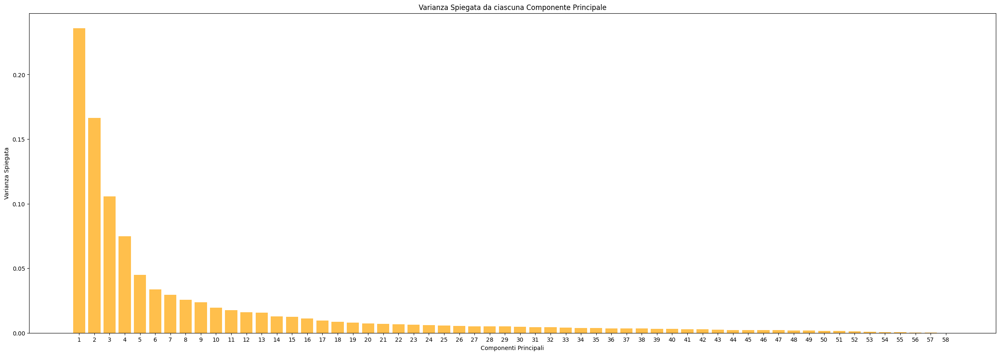

In [4]:
# Grafico della varianza spiegata da ciascuna componente principale
plt.figure(figsize=(30, 10))
plt.bar(range(1, len(explained_variances) + 1), explained_variances, alpha=0.7, color='orange')
plt.xlabel('Componenti Principali')
plt.ylabel('Varianza Spiegata')
plt.title('Varianza Spiegata da ciascuna Componente Principale')
plt.xticks(range(1, len(explained_variances) + 1))  # Aggiungi i numeri delle componenti sull'asse x
plt.show()

CERCO DI ESTRARRE QUALCHE ALTRA FEATURE DAL DATASET PER VEDERE SE SI MIGLIORANO I RISULTATI

In [5]:
# Passo 2: Aggiungi le nuove colonne

music_data_mod = pd.read_csv('Data/features_30_sec.csv') 

music_data_mod['rms_var_to_mean'] = music_data_mod['rms_var'] / music_data_mod['rms_mean']
music_data_mod['chroma_stft_var_to_mean'] = music_data_mod['chroma_stft_var'] / music_data_mod['chroma_stft_mean']
music_data_mod['rolloff_to_centroid'] = music_data_mod['rolloff_mean'] / music_data_mod['spectral_centroid_mean']
music_data_mod['spectral_bandwidth_to_centroid'] = music_data_mod['spectral_bandwidth_mean'] / music_data_mod['spectral_centroid_mean']
music_data_mod['mfcc_mean_sum'] = music_data_mod[[f'mfcc{i}_mean' for i in range(1, 21)]].sum(axis=1)
music_data_mod['mfcc_var_sum'] = music_data_mod[[f'mfcc{i}_var' for i in range(1, 21)]].sum(axis=1)
music_data_mod['zero_cross_rolloff_ratio'] = music_data_mod['zero_crossing_rate_mean'] / music_data_mod['rolloff_mean']

colonne=music_data_mod.columns.size
print(colonne)

# Rimuovi le colonne non numeriche
X = music_data_mod.drop(columns=['label', 'filename'])
feature_names = X.columns  # Salva i nomi delle colonne originali

# Normalizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applica PCA
pca = PCA()  # Per calcolare tutte le componenti principali
X_pca = pca.fit_transform(X_scaled)

# Identifica le feature più rappresentative per ogni componente principale
pc_feature_contributions = pd.DataFrame(pca.components_, columns=feature_names, index=[f'PC{i+1}' for i in range(len(pca.components_))])

# Trova la feature con il valore assoluto più alto per ogni PC
most_influential_features = pc_feature_contributions.abs().idxmax(axis=1)
explained_variances = pca.explained_variance_ratio_

# Combina i risultati in un DataFrame
pc_summary = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca.components_))],
    'Most Influential Feature': most_influential_features.values,
    'Explained Variance Ratio': explained_variances
})
pd.set_option('display.max_columns', None)  #per stampare tutte le colonne
print(pc_summary)


68
   Principal Component  Most Influential Feature  Explained Variance Ratio
0                  PC1              mfcc_var_sum              2.286286e-01
1                  PC2   spectral_bandwidth_mean              1.735903e-01
2                  PC3               mfcc10_mean              9.609205e-02
3                  PC4               mfcc17_mean              7.091394e-02
4                  PC5  zero_cross_rolloff_ratio              4.702104e-02
..                 ...                       ...                       ...
61                PC62   spectral_bandwidth_mean              4.212506e-05
62                PC63    spectral_centroid_mean              7.667914e-06
63                PC64                     tempo              8.711960e-08
64                PC65              mfcc_var_sum              3.372128e-18
65                PC66              mfcc_var_sum              0.000000e+00

[66 rows x 3 columns]


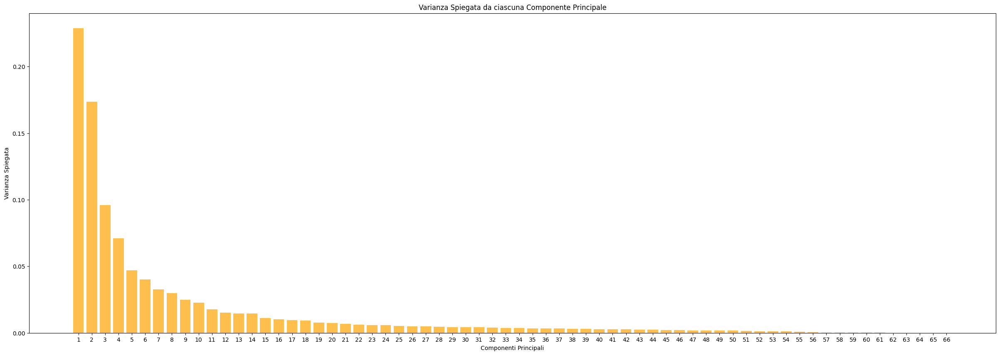

In [6]:
# Grafico della varianza spiegata da ciascuna componente principale
plt.figure(figsize=(30, 10))
plt.bar(range(1, len(explained_variances) + 1), explained_variances, alpha=0.7, color='orange')
plt.xlabel('Componenti Principali')
plt.ylabel('Varianza Spiegata')
plt.title('Varianza Spiegata da ciascuna Componente Principale')
plt.xticks(range(1, len(explained_variances) + 1))  # Aggiungi i numeri delle componenti sull'asse x
plt.show()

In [7]:
# Separare le caratteristiche e le etichette
X = music_data_original.drop(columns=['filename', 'label'])  # Rimuovi filename e label
y = music_data_original['label']  # Etichette

# Suddividere il music_data_originalset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()
minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    f2 = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'F2-score: {f2:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

           Scaler: RobustScaler()
Accuratezza: 0.7200
Precision: 0.7230
Recall: 0.7325
F1-score: 0.7220
F2-score: 0.7270
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7400
Precision: 0.7343
Recall: 0.7464
F1-score: 0.7344
F2-score: 0.7401
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7650
Precision: 0.7704
Recall: 0.7766
F1-score: 0.7642
F2-score: 0.7695
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------


<h1 STUDIO DELLE FEATURE DI 3S>

In [8]:
# Separare le caratteristiche e le etichette
X = music_data_mod.drop(columns=['filename', 'label'])  # Rimuovi filename e label
y = music_data_mod['label']  # Etichette

# Suddividere il music_data_originalset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()
minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    f2 = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'F2-score: {f2:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

           Scaler: RobustScaler()
Accuratezza: 0.7350
Precision: 0.7372
Recall: 0.7465
F1-score: 0.7383
F2-score: 0.7423
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7500
Precision: 0.7427
Recall: 0.7533
F1-score: 0.7427
F2-score: 0.7479
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7550
Precision: 0.7579
Recall: 0.7669
F1-score: 0.7553
F2-score: 0.7608
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7923
Recall: 0.8060
F1-score: 0.7892
F2-score: 0.7970
------------------------------------------------------------


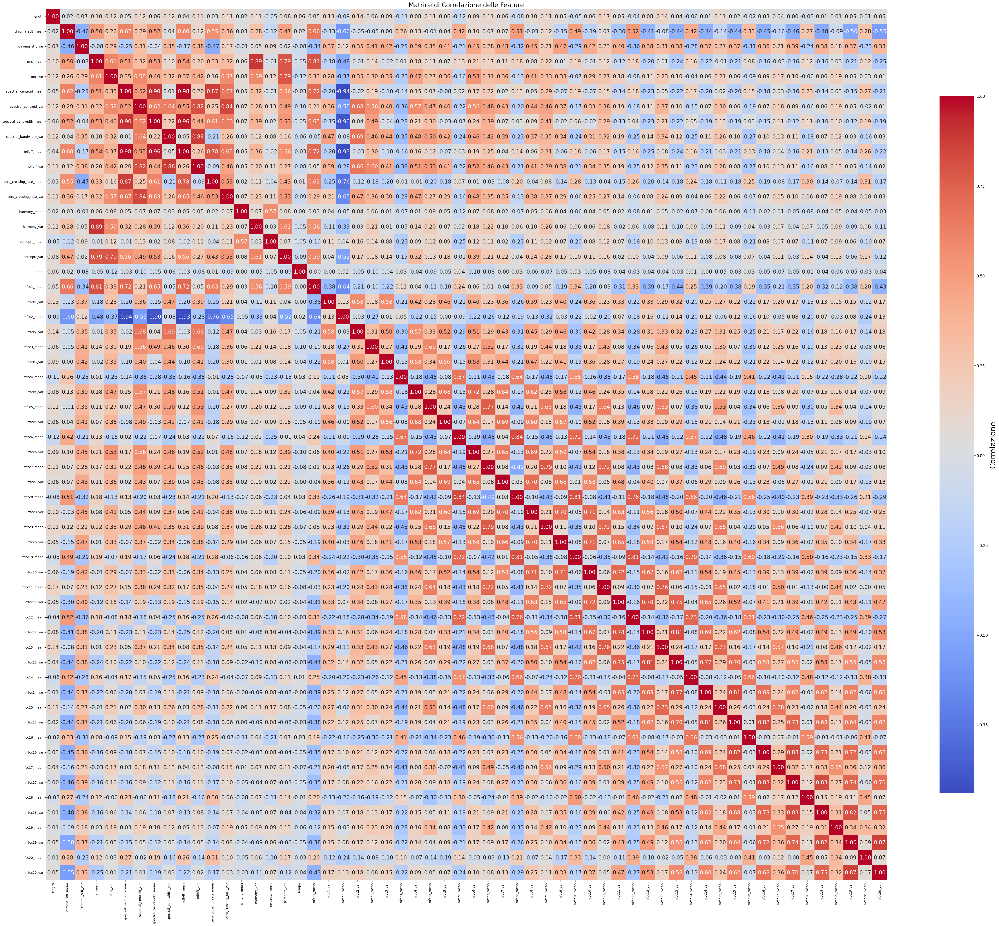

In [9]:
# Rimuovi le colonne non numeriche

X = music_data_original.drop(columns=['label', 'filename'])

# Calcola la matrice di correlazione
correlation_matrix = X.corr()

# Configura la dimensione della heatmap
plt.figure(figsize=(60, 50))

# Crea la heatmap
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                       xticklabels=X.columns, yticklabels=X.columns,
                       annot_kws={"size": 17},  # Aumenta la dimensione del font per i valori
                       cbar_kws={"shrink": 0.8, "label": "Correlazione"})  # Rimuovi fontsize da qui


plt.title('Matrice di Correlazione delle Feature', fontsize=20)  # Aumenta la dimensione del titolo


# Personalizza il colorbar
colorbar = heatmap.collections[0].colorbar  # Ottieni il colorbar dalla heatmap
colorbar.ax.tick_params(labelsize=12)  # Aumenta la dimensione del font dei ticks
colorbar.set_label("Correlazione", fontsize=24)  # Imposta il font della label del colorbar


# Mostra la heatmap

plt.show()

In [10]:
# Separare le caratteristiche e le etichette
X = music_data_original.drop(columns=['filename', 'label','rolloff_mean','mfcc2_mean'])  # Rimuovi filename e label
y = music_data_original['label']  # Etichette

# Suddividere il music_data_originalset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()
minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    f2 = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'F2-score: {f2:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

           Scaler: RobustScaler()
Accuratezza: 0.7300
Precision: 0.7320
Recall: 0.7423
F1-score: 0.7320
F2-score: 0.7370
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7450
Precision: 0.7386
Recall: 0.7514
F1-score: 0.7393
F2-score: 0.7452
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7650
Precision: 0.7701
Recall: 0.7766
F1-score: 0.7651
F2-score: 0.7702
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7850
Precision: 0.7882
Recall: 0.7970
F1-score: 0.7831
F2-score: 0.7891
------------------------------------------------------------


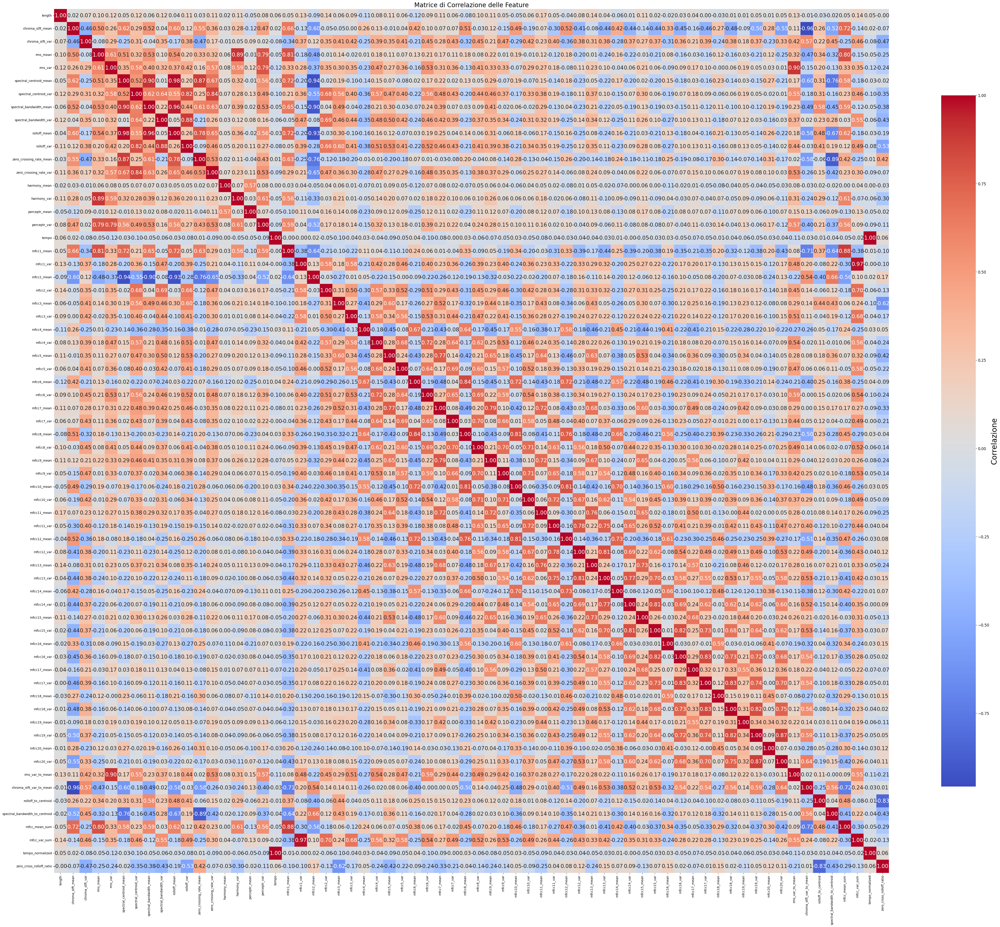

In [11]:
# Rimuovi le colonne non numeriche

X = music_data_mod.drop(columns=['label', 'filename'])

# Calcola la matrice di correlazione
correlation_matrix = X.corr()

# Configura la dimensione della heatmap
plt.figure(figsize=(60, 50))

# Crea la heatmap
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                       xticklabels=X.columns, yticklabels=X.columns,
                       annot_kws={"size": 17},  # Aumenta la dimensione del font per i valori
                       cbar_kws={"shrink": 0.8, "label": "Correlazione"})  # Rimuovi fontsize da qui


plt.title('Matrice di Correlazione delle Feature', fontsize=20)  # Aumenta la dimensione del titolo


# Personalizza il colorbar
colorbar = heatmap.collections[0].colorbar  # Ottieni il colorbar dalla heatmap
colorbar.ax.tick_params(labelsize=12)  # Aumenta la dimensione del font dei ticks
colorbar.set_label("Correlazione", fontsize=24)  # Imposta il font della label del colorbar


# Mostra la heatmap

plt.show()

In [17]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Carica i dati
file_path = 'Data/features_30_sec.csv'  # Assicurati di fornire il percorso corretto
music_data_original = pd.read_csv(file_path)

# Separa le features e la variabile target
X = music_data_original.drop(columns=['label', 'filename'])
y = music_data_original['label']
# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()
minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]


for scaler in scalers:
# Normalizza i dati

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)



    # Divisione del dataset
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Applica RFE
    model = RandomForestClassifier(random_state=42)
    rfe = RFE(estimator=model, n_features_to_select=50)  # Seleziona le 10 migliori feature
    rfe.fit(X_train, y_train)

    # Seleziona le feature importanti
    selected_features = X.columns[rfe.support_]

    # Addestra un modello con le feature selezionate
    X_train_selected = rfe.transform(X_train)
    X_test_selected = rfe.transform(X_test)

    model.fit(X_train_selected, y_train)

    # Valuta il modello
    y_pred = model.predict(X_test_selected)

    # Visualizza le feature selezionate
    print("Selected Features:", selected_features)




        # Calcolare l'accuratezza
        # Calcolare metriche
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    f2 = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

        # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'F2-score: {f2:.4f}')
    # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')


Selected Features: Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc15_mean', 'mfcc16_mean',
       'mfcc17_mean', 'mfcc18_var', 'mfcc19_var', 'mfcc20_var'],
      dtype='object')
           Scaler: RobustScaler()
Accuratezza: 0.7550
Precision: 0.7584
Recall: 0.7619
F1

           Scaler: RobustScaler()
Accuratezza: 0.7400
Precision: 0.7515
Recall: 0.7516
F1-score: 0.7427
F2-score: 0.7455
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7400
Precision: 0.7515
Recall: 0.7516
F1-score: 0.7427
F2-score: 0.7455
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7450
Precision: 0.7576
Recall: 0.7564
F1-score: 0.7480
F2-score: 0.7504
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.6650
Precision: 0.6817
Recall: 0.6832
F1-score: 0.6715
F2-score: 0.6754
------------------------------------------------------------
           Scaler: RobustScaler()
Accuratezza: 0.7450
Precision: 0.7542
Recall: 0.7582
F1-score: 0.7497
F2-score: 0.7530
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7450
Precision: 0.7542
Recall: 0.

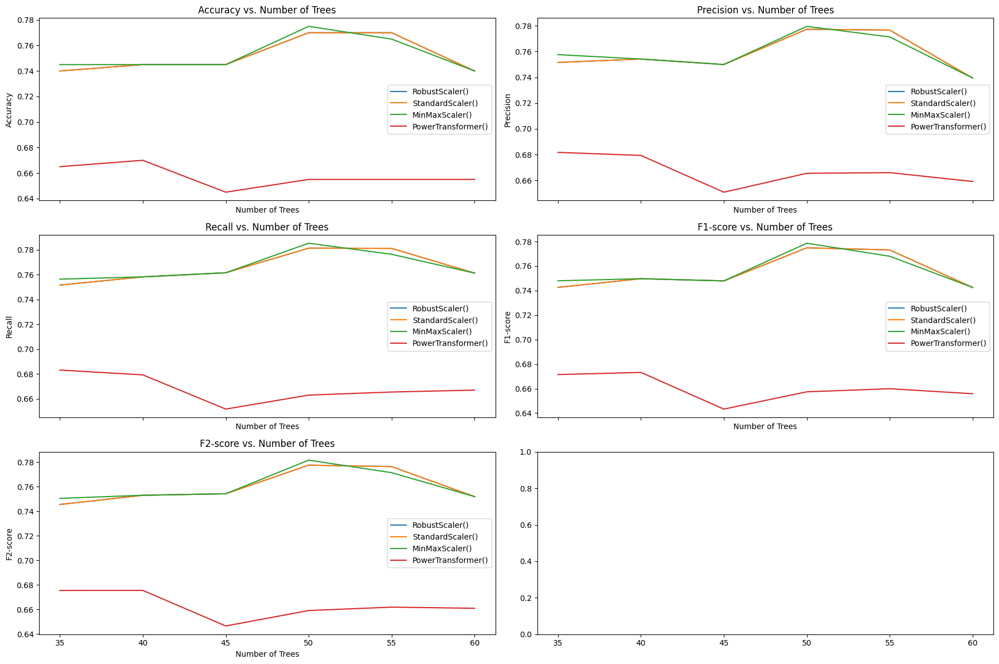

In [22]:
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, PowerTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score
import pandas as pd

# Carica i dati
file_path = 'Data/features_30_sec.csv'  # Assicurati di fornire il percorso corretto
music_data_original = pd.read_csv(file_path)

# Separa le features e la variabile target
X = music_data_original.drop(columns=['label', 'filename'])
y = music_data_original['label']

# Scalatori da provare
scalers = [RobustScaler(), StandardScaler(), MinMaxScaler(), PowerTransformer()]

# Crea una lista per memorizzare le metriche per ciascun numero di alberi
n_estimators_range = range(35, 65, 5)
accuracy_results = []
precision_results = []
recall_results = []
f1_results = []
f2_results = []

for n_estimators in n_estimators_range:
    for scaler in scalers:
        # Normalizza i dati
        X_scaled = scaler.fit_transform(X)
        
        # Divisione del dataset
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

        # Applica RFE
        model = RandomForestClassifier(n_estimators=n_estimators, random_state=42)
        rfe = RFE(estimator=model, n_features_to_select=50)
        rfe.fit(X_train, y_train)

        # Seleziona le feature importanti
        selected_features = X.columns[rfe.support_]

        # Addestra un modello con le feature selezionate
        X_train_selected = rfe.transform(X_train)
        X_test_selected = rfe.transform(X_test)

        model.fit(X_train_selected, y_train)

        # Valuta il modello
        y_pred = model.predict(X_test_selected)

        # Calcola le metriche
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        f2 = fbeta_score(y_test, y_pred, beta=2, average='macro')

        # Memorizza i risultati delle metriche per il numero di alberi corrente
        accuracy_results.append((n_estimators, scaler, accuracy))
        precision_results.append((n_estimators, scaler, precision))
        recall_results.append((n_estimators, scaler, recall))
        f1_results.append((n_estimators, scaler, f1))
        f2_results.append((n_estimators, scaler, f2))
        
                        # Stampare i risultati
        print(f'           Scaler: {scaler}')
        print(f'Accuratezza: {accuracy:.4f}')
        print(f'Precision: {precision:.4f}')
        print(f'Recall: {recall:.4f}')
        print(f'F1-score: {f1:.4f}')
        print(f'F2-score: {f2:.4f}')
            # print(f'Hinge Loss: {loss}')
        print('------------------------------------------------------------')

# Trasforma i risultati in DataFrame per facilitare la visualizzazione
results_df = pd.DataFrame({
    'n_estimators': [res[0] for res in accuracy_results],
    'Scaler': [str(res[1]) for res in accuracy_results],
    'Accuracy': [res[2] for res in accuracy_results],
    'Precision': [res[2] for res in precision_results],
    'Recall': [res[2] for res in recall_results],
    'F1-score': [res[2] for res in f1_results],
    'F2-score': [res[2] for res in f2_results],
})

# Plot delle metriche rispetto al numero di estimatori per ciascun scaler
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharex=True)
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-score', 'F2-score']
for i, metric in enumerate(metric_names):
    ax = axes[i // 2, i % 2]
    for scaler in scalers:
        scaler_name = str(scaler)
        subset = results_df[results_df['Scaler'] == scaler_name]
        ax.plot(subset['n_estimators'], subset[metric], label=scaler_name)
    ax.set_title(f'{metric} vs. Number of Trees')
    ax.set_xlabel('Number of Trees')
    ax.set_ylabel(metric)
    ax.legend()
    ax.set_xticks(list(n_estimators_range))  # Imposta i valori specifici per i tick
    ax.set_xticklabels(list(n_estimators_range))  # Etichetta con i valori numerici

plt.tight_layout()
plt.show()



